# SNA Term Project
---
We consider multiple pages related to tourism and focus on whose follower list will be examined. That means that they are in the spotlight of this analysis. Those nodes are considered the `spotlight nodes`.

**References:**
- [Facebook Network Analysis](https://networkx.org/nx-guides/content/exploratory_notebooks/facebook_notebook.html#facebook-network-analysis)

In [1]:
from random import randint

import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [3]:
edges_df = pd.read_csv(
    "../data/input/edges.csv"
)
edges_df.info()
edges_df

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 699 entries, 0 to 698
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Start node  699 non-null    object
 1   End node    699 non-null    object
 2   Edge type   699 non-null    object
dtypes: object(3)
memory usage: 16.5+ KB


,Start node,End node,Edge type
0,Age Pae Tapanat,โคตรคูล,user-page
1,Papp Phankosol,Unseen Tour Thailand,user-page
2,Somkaew Thamonwan,โคตรคูล,user-page
3,Somkaew Thamonwan,เทยเที่ยวไทย & friends,user-page
4,Somkaew Thamonwan,อาสาพาไปหลง - asapapailong,user-page
...,...,...,...
694,Non Nuttawat,Sneak out หนีเที่ยว,user-page
695,Praew Phattharaphorn,Sneak out หนีเที่ยว,user-page
696,Thiprada Thipda,Sneak out หนีเที่ยว,user-page
697,Bobby Panturat,Sneak out หนีเที่ยว,user-page


In [3]:
edges_df.columns = edges_df.columns.str.lower().str.replace(' ', '_')

In [4]:
G = nx.from_pandas_edgelist(edges_df, source="start_node", target="end_node")

In [5]:
G

## Visualize Graph
---

In [6]:
type(nx.random_layout(G))

dict

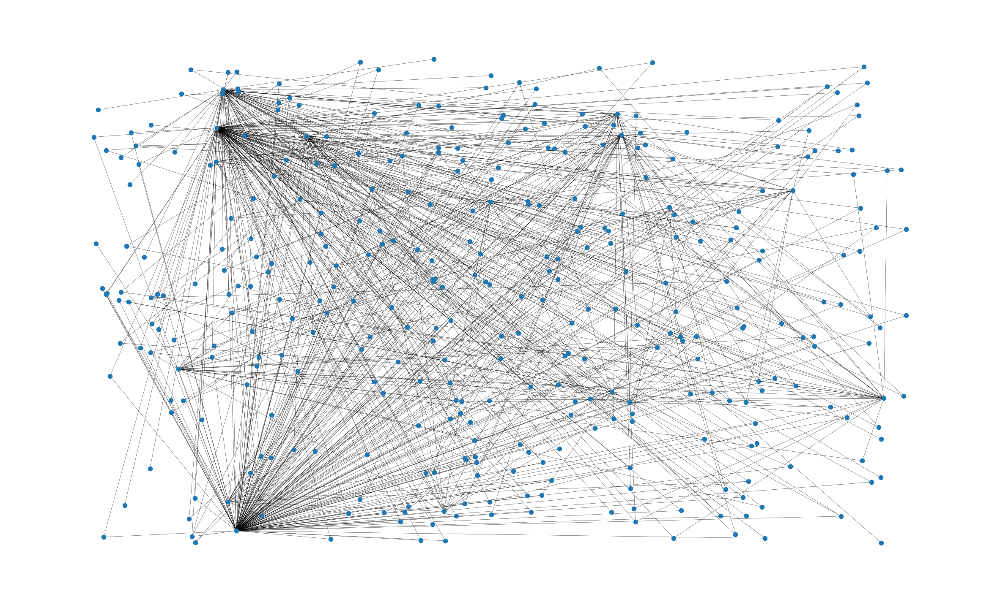

In [7]:
fig, ax = plt.subplots(figsize=(15, 9))
ax.axis("off")
plot_options = {"node_size": 10, "with_labels": False, "width": 0.15}
nx.draw_networkx(G, pos=nx.random_layout(G), ax=ax, **plot_options)

In [101]:
list(nx.spring_layout(G, iterations=15, seed=1721).items())[:10]

[('Age Pae Tapanat', array([0.53793381, 0.741017  ])),
 ('โคตรคูล', array([0.49323572, 0.3538794 ])),
 ('Papp Phankosol', array([ 0.40965098, -0.01305349])),
 ('Unseen Tour Thailand', array([ 0.38489681, -0.25872898])),
 ('Somkaew Thamonwan', array([ 0.05778573, -0.13678578])),
 ('เทยเที่ยวไทย & friends ', array([-0.45717753, -0.10466524])),
 ('อาสาพาไปหลง - asapapailong', array([ 0.34422194, -0.23990573])),
 ('TripTH ทริปไทยแลนด์', array([ 0.54144483, -0.12837339])),
 ('Gluta Story', array([ 0.08752189, -0.15517066])),
 ('บันทึกคนขี้เที่ยว', array([0.58494788, 0.32188498]))]

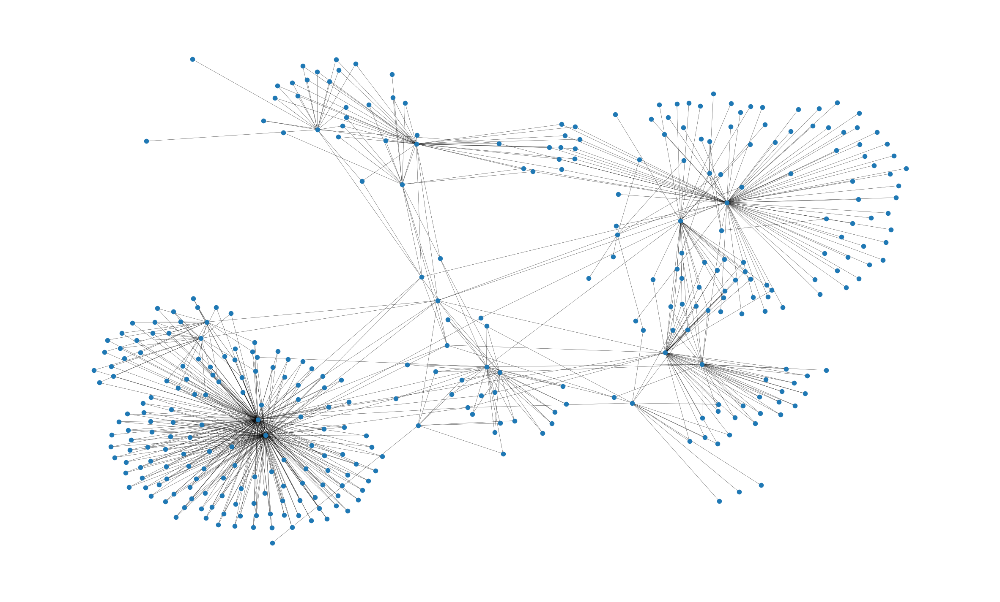

In [9]:
pos = nx.spring_layout(G, iterations=15, seed=1721)
fig, ax = plt.subplots(figsize=(15, 9))
ax.axis("off")
nx.draw_networkx(G, pos=pos, ax=ax, **plot_options)

In [10]:
G.number_of_nodes()

360

In [11]:
G.number_of_edges()

667

In [12]:
# number of adjacent nodes
np.mean([d for _, d in G.degree()])

np.float64(3.7055555555555557)

On average, a node is connected to almost `4` other nodes, also known as neighbors of the node.

In [13]:
shortest_path_lengths = dict(nx.all_pairs_shortest_path_length(G))

In [15]:
shortest_path_lengths['Opal Patanajirasit']['GWM ลำลูกกา']

3

Length of shortest path between nodes `Opal Patanajirasit` and `GWM ลำลูกกา` of 3

In [16]:
diameter = max(nx.eccentricity(G, sp=shortest_path_lengths).values())
diameter

6

In order to connect from one node to any other one we would have to traverse `6` edges or fewer (equal diameter of graph).

In [17]:
# Compute the average shortest path length for each node
average_path_lengths = [
    np.mean(list(spl.values())) for spl in shortest_path_lengths.values()
]
# The average over all nodes
np.mean(average_path_lengths)

np.float64(3.189722222222222)

This represents the average of the shortest path length for all pairs of nodes: in order to reach from one node to another node, roughly `3.19` edges will be traversed on average.

Text(0, 0.5, 'Frequency (%)')

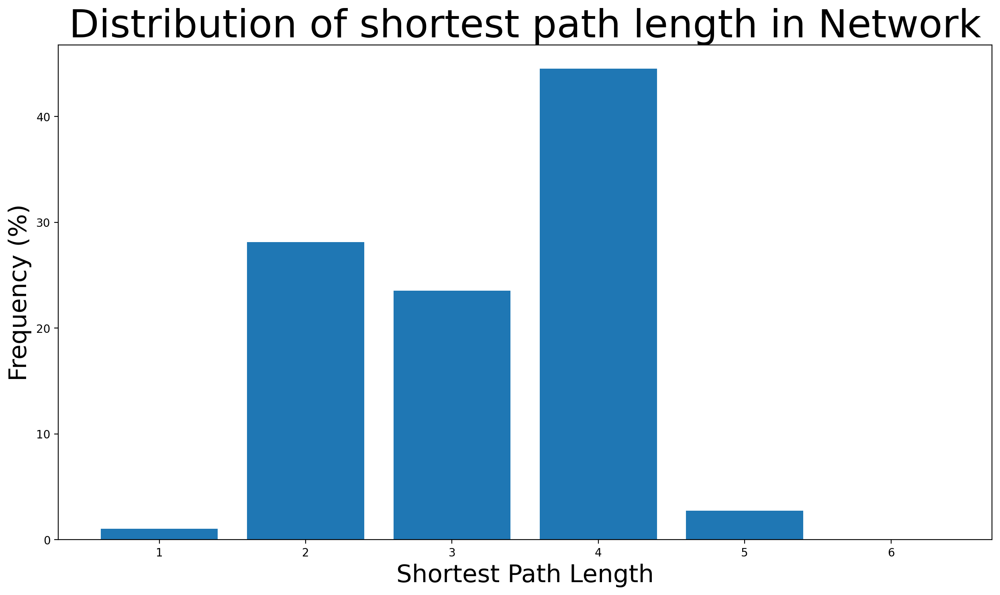

In [18]:
# We know the maximum shortest path length (the diameter), so create an array
# to store values from 0 up to (and including) diameter
path_lengths = np.zeros(diameter + 1, dtype=int)

# Extract the frequency of shortest path lengths between two nodes
for pls in shortest_path_lengths.values():
    pl, cnts = np.unique(list(pls.values()), return_counts=True)
    path_lengths[pl] += cnts

# Express frequency distribution as a percentage (ignoring path lengths of 0)
freq_percent = 100 * path_lengths[1:] / path_lengths[1:].sum()

# Plot the frequency distribution (ignoring path lengths of 0) as a percentage
fig, ax = plt.subplots(figsize=(15, 8))
ax.bar(np.arange(1, diameter + 1), height=freq_percent)
ax.set_title(
    "Distribution of shortest path length in Network", fontdict={"size": 35}, loc="center"
)
ax.set_xlabel("Shortest Path Length", fontdict={"size": 22})
ax.set_ylabel("Frequency (%)", fontdict={"size": 22})

The majority of the shortest path lengths are from `2` to `4` edges long. Also, it’s highly unlikely for a pair of nodes to have a shortest path of length `6` (diameter length).

In [19]:
nx.density(G)

0.010321881770349737

Clearly, the graph is a very sparse one as: `density < 1`

In [20]:
nx.number_connected_components(G)

1

## Centrality Measure
---

### Degree Centrality

In [103]:
degree_centrality = nx.degree_centrality(G)
# degree_centrality

In [22]:
sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True)[:5]

[('HongTae Pisitkarn', 0.4456824512534819),
 ('Go Went Go', 0.3788300835654596),
 ('แบกกล้องเที่ยว', 0.20612813370473537),
 ('Opal Patanajirasit', 0.12813370473537605),
 ('Nuntaporn Khajonmahalap', 0.10584958217270195)]

In [30]:
pd.DataFrame(sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True)[:5])

,0,1
0,HongTae Pisitkarn,0.445682
1,Go Went Go,0.378830
2,แบกกล้องเที่ยว,0.206128
3,Opal Patanajirasit,0.128134
4,Nuntaporn Khajonmahalap,0.105850


That means that node `Go Went Go` has the highest degree centrality from `spotlight nodes` with `0.37`, meaning that `Go Went Go` is followed with around the 37% of the whole network.

Very interesting is the fact that the nodes `HongTae Pisitkarn` is the top highest degree centralities even though we do not investigate their circles. In other words, that node is very popular among the circles we examine now, meaning they have the most facebook friends inside this network apart from the spotlight nodes.

In [23]:
sorted(G.degree, key=lambda item: item[1], reverse=True)[:5]

[('HongTae Pisitkarn', 160),
 ('Go Went Go', 136),
 ('แบกกล้องเที่ยว', 74),
 ('Opal Patanajirasit', 46),
 ('Nuntaporn Khajonmahalap', 38)]

As expected, node `HongTae Pisitkarn` has `160` facebook friends which is the most any facebook user has in this analysis.

In [37]:
degree_central_df = pd.DataFrame(degree_centrality.items(), columns=['node', 'degree_central'])
degree_central_df

,node,degree_central
0,Age Pae Tapanat,0.002786
1,โคตรคูล,0.089136
2,Papp Phankosol,0.005571
3,Unseen Tour Thailand,0.038997
4,Somkaew Thamonwan,0.072423
...,...,...
355,Saksorn Ruangtanusak,0.002786
356,Non Nuttawat,0.002786
357,Thiprada Thipda,0.002786
358,Bobby Panturat,0.002786


In [39]:
degree_central_df.describe()

,degree_central
count,360.000000
mean,0.010322
std,0.034309
min,0.002786
25%,0.005571
50%,0.005571
75%,0.005571
max,0.445682


In [47]:
degree_central_df[degree_central_df['degree_central']>0.1]

,node,degree_central
13,แบกกล้องเที่ยว,0.206128
40,Go Went Go,0.378830
198,HongTae Pisitkarn,0.445682
199,Opal Patanajirasit,0.128134
223,Nuntaporn Khajonmahalap,0.105850


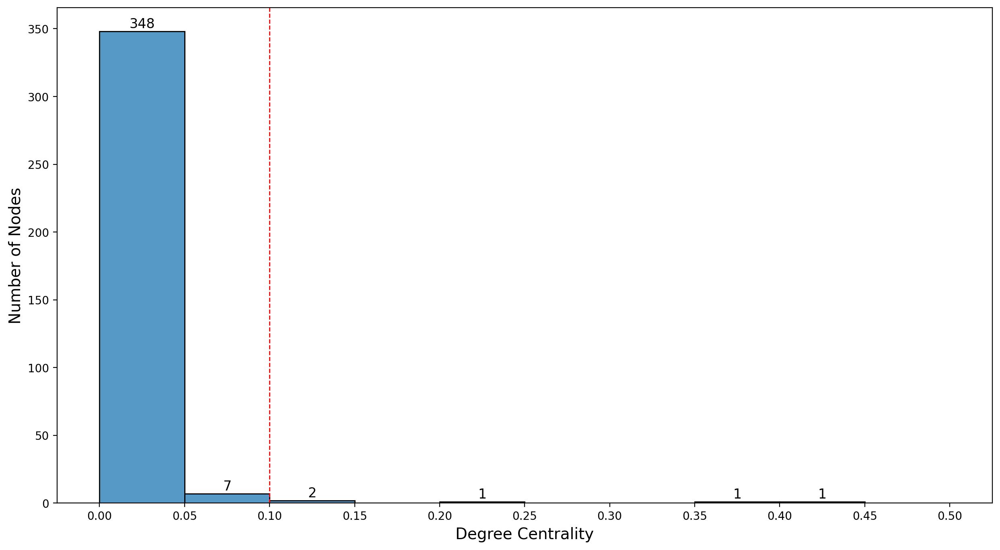

In [66]:
plt.figure(figsize=(15, 8))
ax = sns.histplot(data=degree_central_df,
            x='degree_central',
            binrange=(0, 0.5),
            binwidth=0.05)
# Adding value text on each bar
for p in ax.patches:
    height = p.get_height()
    if height > 0:  # Only annotate bars that have a height greater than 0
        ax.text(p.get_x() + p.get_width() / 2, height + 0.5, f'{int(height)}', 
                ha='center', fontsize=12, color='black', va='bottom')

# Adding a vertical line at x = 0.1
plt.axvline(x=0.1, color='red', linestyle='--', linewidth=1)

# Setting axis labels
ax.set_xlabel("Degree Centrality", fontsize=14)
ax.set_ylabel("Number of Nodes", fontsize=14)

# Setting x-tick labels every 0.05
ax.set_xticks([i * 0.05 for i in range(11)])

It is visible that the vast majority of facebook users have degree centralities of less than `0.1`. Actually, that makes sense because the network consists of friends lists of particular nodes, which are obviously the ones with the highest degree centralities. In other words, because only the friends list of particular nodes were used to create this particular network, plenty of nodes have extremely low degree centralities as they are not very interconnected in this network

(np.float64(-1.0154244045955847),
 np.float64(1.1915109162737885),
 np.float64(-0.8998556504790397),
 np.float64(1.0688803856633917))

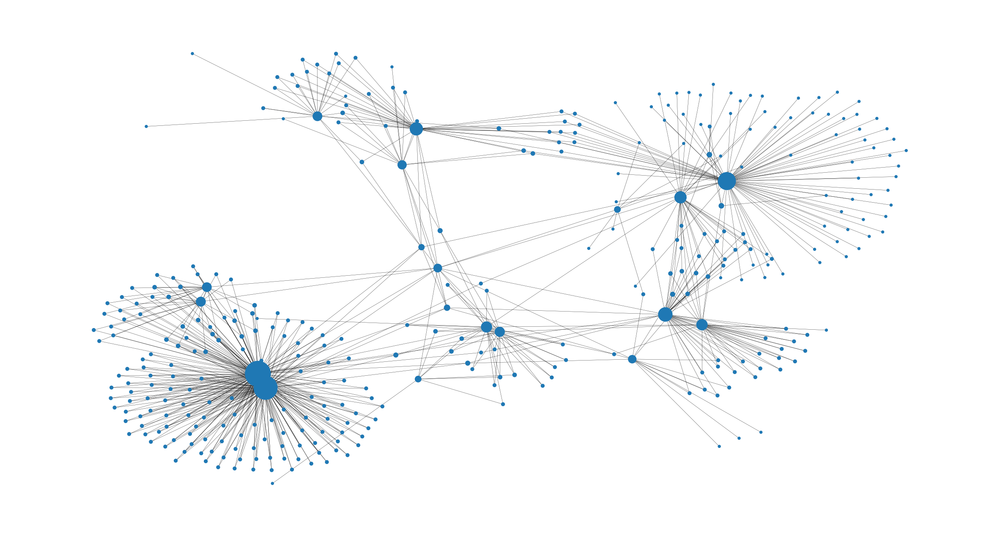

In [25]:
node_size = [
    v * 1000 for v in degree_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(G, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

### Betweeness Centrality
A user with a high betweenness centrality acts as a bridge to many users that are not friends and thus has the ability to influence them by conveying information.

In [69]:
betweenness_centrality = nx.betweenness_centrality(
    G
) 
sorted(betweenness_centrality.items(), key=lambda item: item[1], reverse=True)[:7]

[('HongTae Pisitkarn', 0.445299262749704),
 ('แบกกล้องเที่ยว', 0.3339358240177267),
 ('Praew Phattharaphorn', 0.3156835247364757),
 ('Go Went Go', 0.2063045339724243),
 ('Opal Patanajirasit', 0.17549833380399965),
 ('Somkaew Thamonwan', 0.12822463182165045),
 ('Tawan Halo Vijabund', 0.11225292463597832)]

Looking at the results, the node `HongTae Pisitkarn` has a betweenness centrality of `0.44`, meaning it lies on almost half of the total shortest paths between other nodes. Also, combining the knowledge of the degree centrality:
- Nodes `แบกกล้องเที่ยว` and `Go Went Go` have both the highest degree and betweenness centralities and are `spotlight nodes`. That indicates that those nodes are both the most popular ones in this network and can also influence and spread information in the network as a result it is an expected finding.
- Nodes `HongTae Pisitkarn` are not spotlight nodes, have both the highest degree and betweenness centralities. That indicates that node is both the most popular ones in this network and can also influence and spread information in the network as a result it is an expected finding.
- `Praew Phattharaphorn` is not spotlight node, has a very high betweenness centrality even though it has not the highest degree centralities. In other words, this node does not have a very large friends list on facebook. However, the user’s whole friend list is a part of the network and thus the user could connect different circles in this network by being the middleman. they have the most influence in this network among friends of spotlight nodes when it comes to spreading information.

In [62]:
betweenness_centrality_df = pd.DataFrame(betweenness_centrality.items(),
                                         columns=["node", "betweeness_central"])
betweenness_centrality_df

,node,betweeness_central
0,Age Pae Tapanat,0.000000
1,โคตรคูล,0.063828
2,Papp Phankosol,0.000494
3,Unseen Tour Thailand,0.028082
4,Somkaew Thamonwan,0.128225
...,...,...
355,Saksorn Ruangtanusak,0.000000
356,Non Nuttawat,0.000000
357,Thiprada Thipda,0.000000
358,Bobby Panturat,0.000000


In [63]:
betweenness_centrality_df.describe()

,betweeness_central
count,360.000000
mean,0.006141
std,0.038021
min,0.000000
25%,0.000000
50%,0.000005
75%,0.000088
max,0.445299


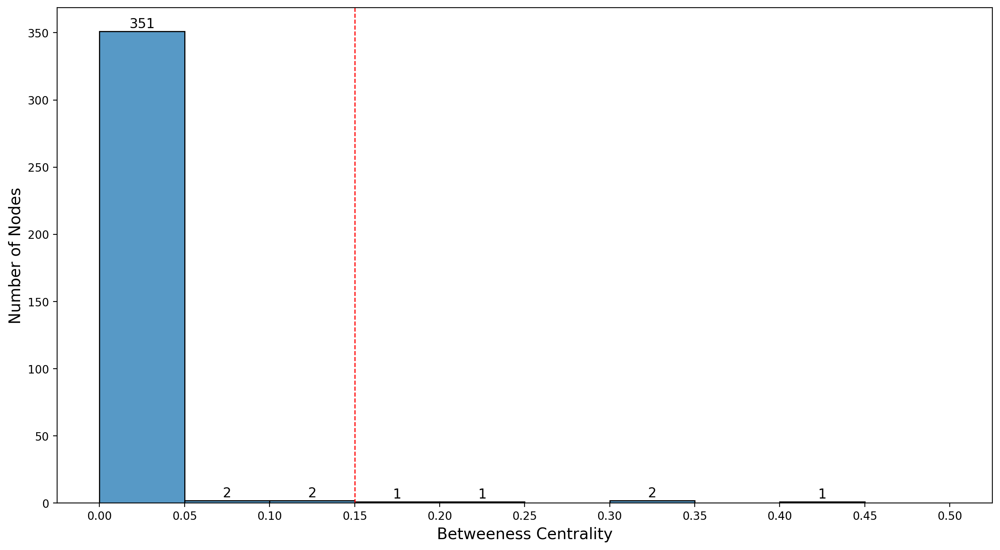

In [68]:
plt.figure(figsize=(15, 8))
ax = sns.histplot(data=betweenness_centrality_df,
            x='betweeness_central',
            binrange=(0, 0.5),
            binwidth=0.05)
# Adding value text on each bar
for p in ax.patches:
    height = p.get_height()
    if height > 0:  # Only annotate bars that have a height greater than 0
        ax.text(p.get_x() + p.get_width() / 2, height + 0.5, f'{int(height)}', 
                ha='center', fontsize=12, color='black', va='bottom')

# Adding a vertical line at x = 0.1
plt.axvline(x=0.15, color='red', linestyle='--', linewidth=1)

# Setting axis labels
ax.set_xlabel("Betweeness Centrality", fontsize=14)
ax.set_ylabel("Number of Nodes", fontsize=14)

# Setting x-tick labels every 0.05
ax.set_xticks([i * 0.05 for i in range(11)])

(np.float64(-1.0154244045955847),
 np.float64(1.1915109162737885),
 np.float64(-0.8998556504790397),
 np.float64(1.0688803856633917))

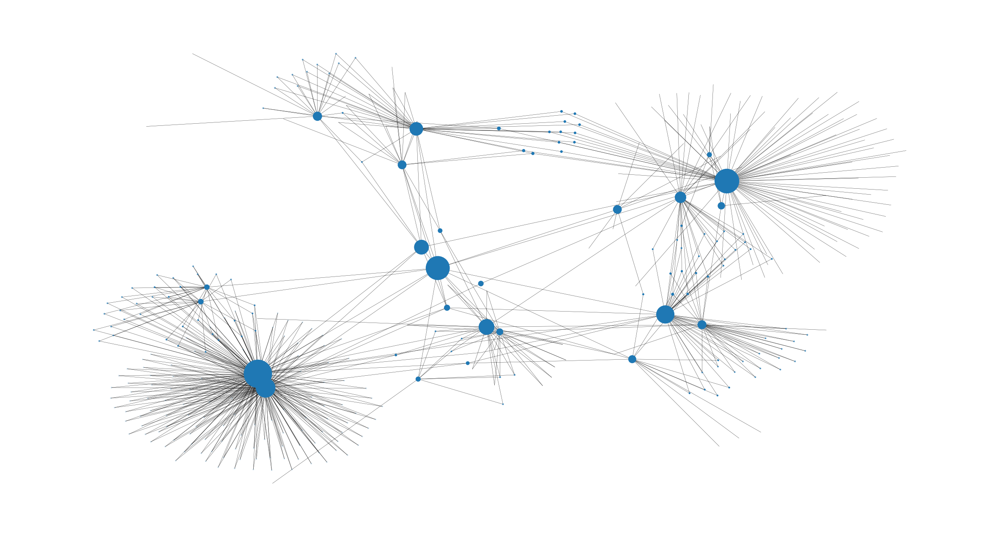

In [28]:
node_size = [
    v * 1200 for v in betweenness_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(G, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

### Closeness Centrality
Closeness centrality scores each node based on their `closeness` to all other nodes in the network. For a node `v`, its closeness centrality measures the average farness to all other nodes. In other words, the higher the closeness centrality of `v`, the closer it is located to the center of the network.

The closeness centrality measure is very important for the monitoring of the spread of false information (e.g. fake news) or viruses (e.g. malicious links that gain control of the facebook account in this case). Let’s examine the example of fake news. If the user with the highest closeness centrality measure started spreading some fake news information (sharing or creating a post), the whole network would get missinformed the quickest possible. However, if a user with very low closeness centrality would try the same, the spread of the missinformation to the whole network would be much slower. That is because the false information would have to firstly reach a user with high closeness centrality that would spread it to many different parts of the network.

In [71]:
closeness_centrality = nx.closeness_centrality(
    G
)  # save results in a variable to use again
closeness_centrality_df = pd.DataFrame(closeness_centrality.items(),
                                      columns=["node", "closeness_central"])
closeness_centrality_df

,node,closeness_central
0,Age Pae Tapanat,0.247416
1,โคตรคูล,0.328454
2,Papp Phankosol,0.260145
3,Unseen Tour Thailand,0.346525
4,Somkaew Thamonwan,0.443758
...,...,...
355,Saksorn Ruangtanusak,0.252817
356,Non Nuttawat,0.252817
357,Thiprada Thipda,0.252817
358,Bobby Panturat,0.252817


In [72]:
closeness_centrality_df.sort_values("closeness_central", ascending=False).head()

,node,closeness_central
198,HongTae Pisitkarn,0.524088
19,Praew Phattharaphorn,0.500000
40,Go Went Go,0.451572
4,Somkaew Thamonwan,0.443758
199,Opal Patanajirasit,0.437805


Inspecting the users with the highest closeness centralities, we understand that there is not a huge gap between them in contrast to the previous metrics. Also, the nodes `HongTae Pisitkarn` and `Go Went Go` are the only spotlight nodes found in the ones with the highest closeness centralities. The node `แบกกล้องเที่ยว` doesn't have highest closeness centrality but have highest degree centrality, that means that a node that has many friends is not necessary close to the center of the network.

In [73]:
closeness_centrality_df.describe()

,closeness_central
count,360.000000
mean,0.317525
std,0.039810
min,0.223955
25%,0.281128
50%,0.321397
75%,0.345525
max,0.524088


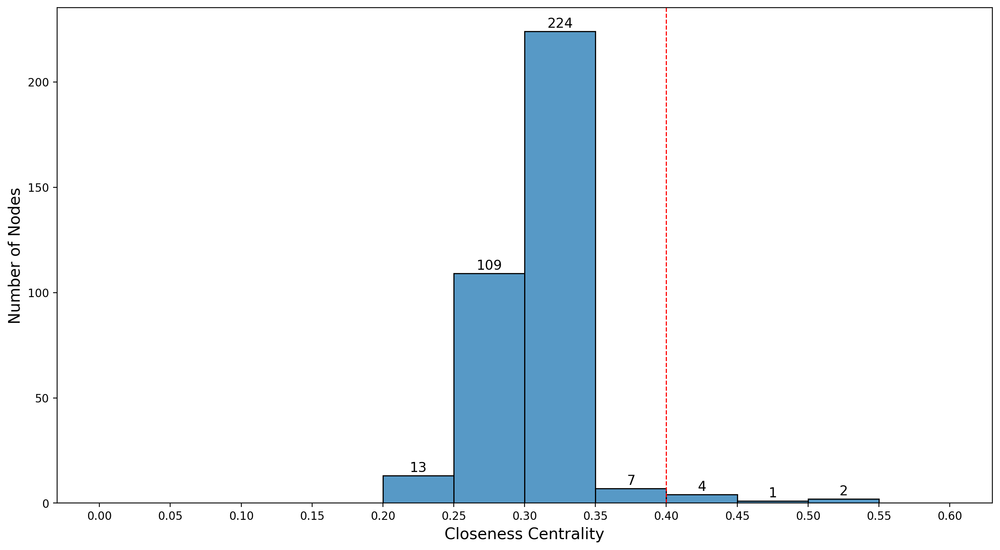

In [79]:
plt.figure(figsize=(15, 8))
ax = sns.histplot(data=closeness_centrality_df,
            x='closeness_central',
            binrange=(0, 0.6),
            binwidth=0.05)
# Adding value text on each bar
for p in ax.patches:
    height = p.get_height()
    if height > 0:  # Only annotate bars that have a height greater than 0
        ax.text(p.get_x() + p.get_width() / 2, height + 0.5, f'{int(height)}', 
                ha='center', fontsize=12, color='black', va='bottom')

# # Adding a vertical line at x = 0.1
plt.axvline(x=0.4, color='red', linestyle='--', linewidth=1)

# # Setting axis labels
ax.set_xlabel("Closeness Centrality", fontsize=14)
ax.set_ylabel("Number of Nodes", fontsize=14)

# Setting x-tick labels every 0.05
ax.set_xticks([i * 0.05 for i in range(13)])

(np.float64(-1.0154244045955847),
 np.float64(1.1915109162737885),
 np.float64(-0.8998556504790397),
 np.float64(1.0688803856633917))

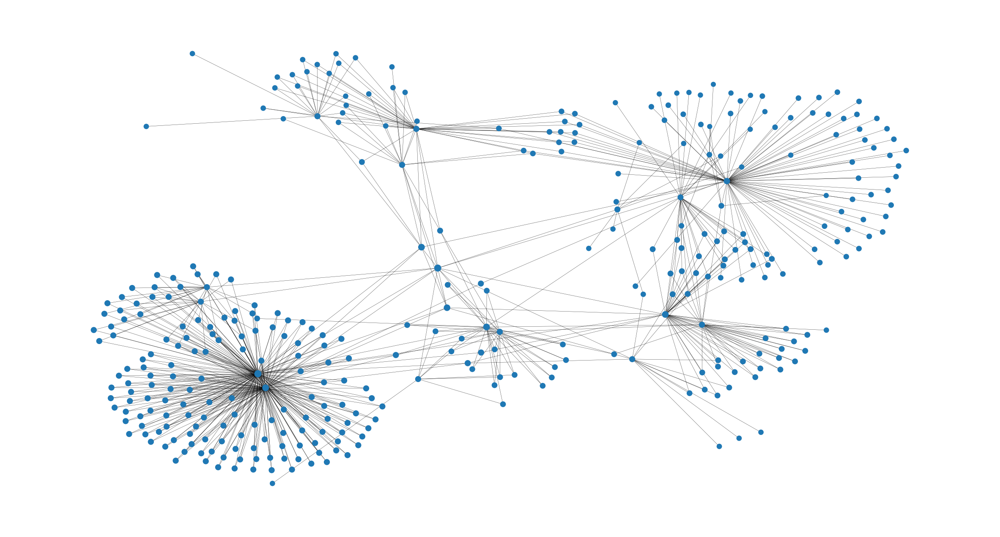

In [81]:
node_size = [
    v * 50 for v in closeness_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(G, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

### Eigenvector Centrality

In [82]:
eigenvector_centrality = nx.eigenvector_centrality(
    G
)  # save results in a variable to use again
eigenvector_centrality_df = pd.DataFrame(eigenvector_centrality.items(),
                                      columns=["node", "eigenvector"])
eigenvector_centrality_df

,node,eigenvector
0,Age Pae Tapanat,0.000549
1,โคตรคูล,0.009320
2,Papp Phankosol,0.001143
3,Unseen Tour Thailand,0.014563
4,Somkaew Thamonwan,0.045168
...,...,...
355,Saksorn Ruangtanusak,0.000286
356,Non Nuttawat,0.000286
357,Thiprada Thipda,0.000286
358,Bobby Panturat,0.000286


In [83]:
eigenvector_centrality_df.sort_values("eigenvector", ascending=False).head()

,node,eigenvector
198,HongTae Pisitkarn,0.519975
40,Go Went Go,0.469657
19,Praew Phattharaphorn,0.079539
106,Mameaw Sasiraporn,0.071720
98,Tawan Halo Vijabund,0.065130


The node is a spotlight node and has the highest eigenvector centrality can be considered the most important node in the network in terms of overall influence to the whole network. If that node also has some of the highest degree centrality and betweeness centrality, making that node very popular and influencious to other nodes.

The nodes are not spotlight nodes but they have the highest eigenvector centrality and all those nodes are identified for the first time, meaning they have neither the highest degreee, betweeness, and closeness centralities. That lead to the conclusion that those nodes are very likely to be connected to the node is spotlight node and has the highest eigenvector centrality and as a result, it makes those nodes have high eigenvector centralities.

In [84]:
high_eigenvector_centralities = (
    sorted(eigenvector_centrality.items(), key=lambda item: item[1], reverse=True)
)[
    1:10
]  # 2nd to 10th nodes with highest eigenvector centralities
high_eigenvector_nodes = [
    tuple[0] for tuple in high_eigenvector_centralities
]  # set list as [2266, 2206, 2233, 2464, 2142, 2218, 2078, 2123, 1993]
neighbors_1912 = [n for n in G.neighbors("HongTae Pisitkarn")]  # list with all nodes connected to 1912
all(
    item in neighbors_1912 for item in high_eigenvector_nodes
)  # check if items in list high_eigenvector_nodes exist in list neighbors_1912

False

In [85]:
eigenvector_centrality_df.describe()

,eigenvector
count,360.000000
mean,0.028897
std,0.044138
min,0.000050
25%,0.001111
50%,0.004272
75%,0.058254
max,0.519975


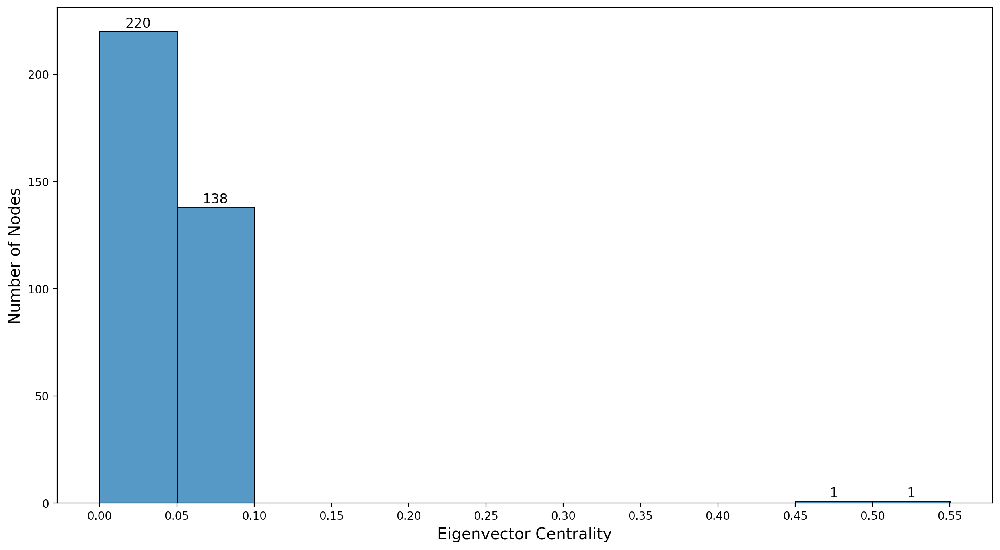

In [86]:
plt.figure(figsize=(15, 8))
ax = sns.histplot(data=eigenvector_centrality_df,
            x='eigenvector',
            binrange=(0, 0.55),
            binwidth=0.05)
# Adding value text on each bar
for p in ax.patches:
    height = p.get_height()
    if height > 0:  # Only annotate bars that have a height greater than 0
        ax.text(p.get_x() + p.get_width() / 2, height + 0.5, f'{int(height)}', 
                ha='center', fontsize=12, color='black', va='bottom')

# # Adding a vertical line at x = 0.1
# plt.axvline(x=0.4, color='red', linestyle='--', linewidth=1)

# # Setting axis labels
ax.set_xlabel("Eigenvector Centrality", fontsize=14)
ax.set_ylabel("Number of Nodes", fontsize=14)

# Setting x-tick labels every 0.05
ax.set_xticks([i * 0.05 for i in range(12)])

(np.float64(-1.0154244045955847),
 np.float64(1.1915109162737885),
 np.float64(-0.8998556504790397),
 np.float64(1.0688803856633917))

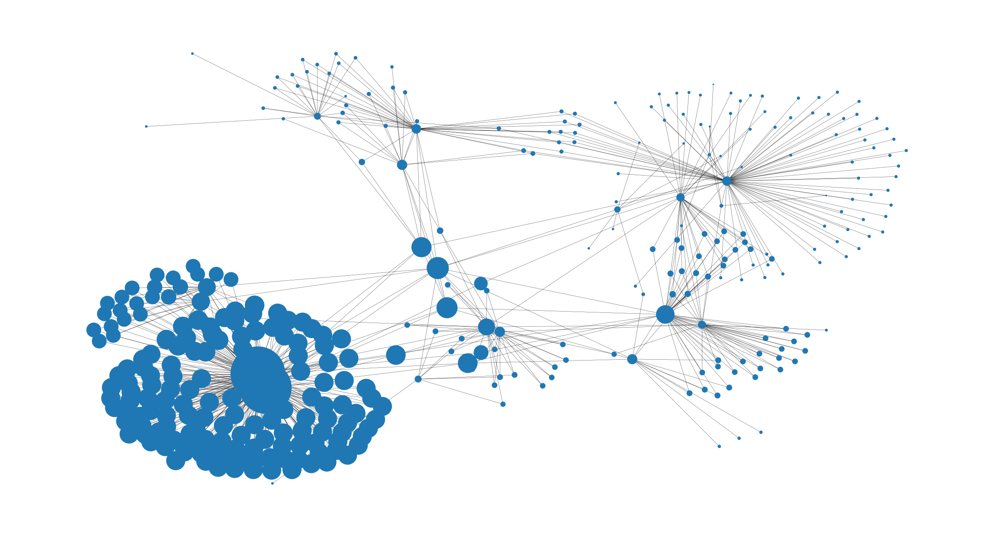

In [87]:
node_size = [
    v * 4000 for v in eigenvector_centrality.values()
]  # set up nodes size for a nice graph representation
plt.figure(figsize=(15, 8))
nx.draw_networkx(G, pos=pos, node_size=node_size, with_labels=False, width=0.15)
plt.axis("off")

## Clustering Effects
---

In [88]:
nx.average_clustering(G)

0.07306851484558884

Text(0, 0.5, 'Counts')

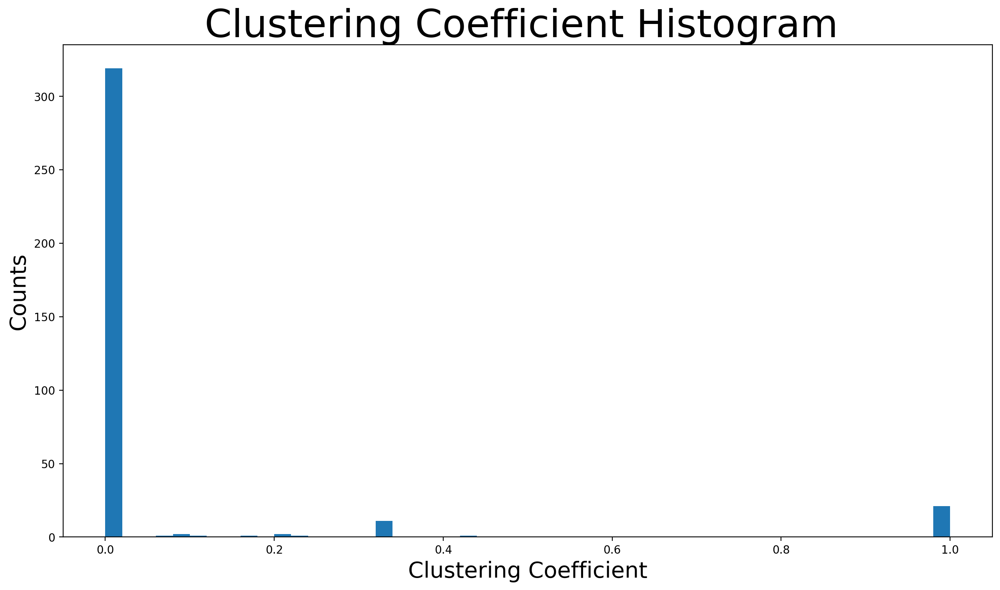

In [89]:
plt.figure(figsize=(15, 8))
plt.hist(nx.clustering(G).values(), bins=50)
plt.title("Clustering Coefficient Histogram ", fontdict={"size": 35}, loc="center")
plt.xlabel("Clustering Coefficient", fontdict={"size": 20})
plt.ylabel("Counts", fontdict={"size": 20})

In [90]:
triangles_per_node = list(nx.triangles(G).values())
sum(
    triangles_per_node
) / 3  # divide by 3 because each triangle is counted once for each node

51.0

In [92]:
np.mean(triangles_per_node)

np.float64(0.425)

In [93]:
np.median(triangles_per_node)

np.float64(0.0)

## Bridges
---

In [94]:
nx.has_bridges(G)

True

In [95]:
bridges = list(nx.bridges(G))
len(bridges)

86

In [96]:
bridges[:5]

[('Age Pae Tapanat', 'โคตรคูล'),
 ('โคตรคูล', 'ดิลก คำอยู่'),
 ('โคตรคูล', 'ละครKoolน่ะทำ'),
 ('โคตรคูล', 'โคตรแมตช์'),
 ('โคตรคูล', 'โคตรคูล LIVE')]

In [104]:
local_bridges = list(nx.local_bridges(G, with_span=False))
len(local_bridges)

570

In [105]:
local_bridges[:5]

[('Age Pae Tapanat', 'โคตรคูล'),
 ('โคตรคูล', 'Somkaew Thamonwan'),
 ('โคตรคูล', 'กอล์ฟมาเยือน'),
 ('โคตรคูล', 'Mayme Vivattanavanich'),
 ('โคตรคูล', 'Monrudee Wongsaroj')]

(np.float64(-1.0154244045955847),
 np.float64(1.1915109162737885),
 np.float64(-0.8998556504790397),
 np.float64(1.0688803856633917))

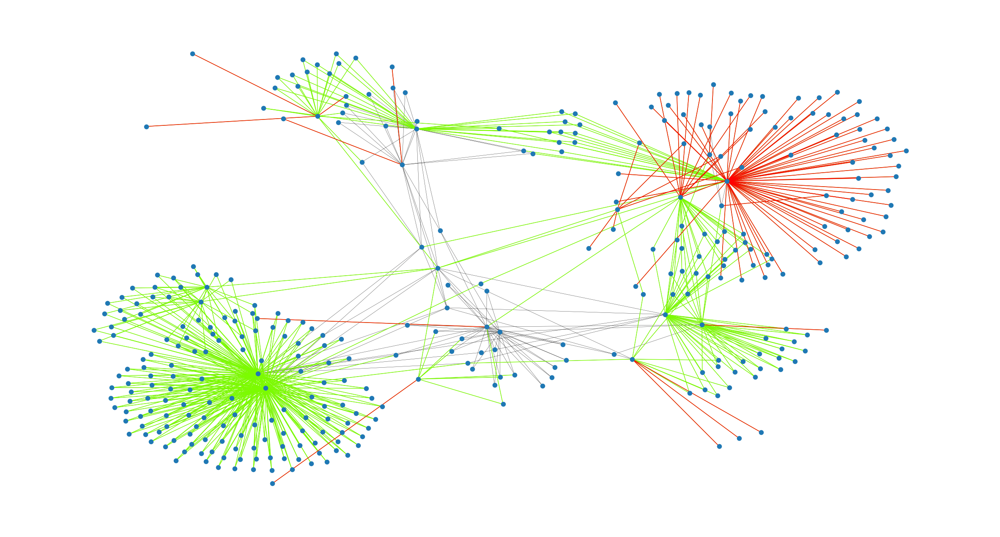

In [106]:
plt.figure(figsize=(15, 8))
nx.draw_networkx(G, pos=pos, node_size=10, with_labels=False, width=0.15)
nx.draw_networkx_edges(
    G, pos, edgelist=local_bridges, width=0.5, edge_color="lawngreen"
)  # green color for local bridges
nx.draw_networkx_edges(
    G, pos, edgelist=bridges, width=0.5, edge_color="r"
)  # red color for bridges
plt.axis("off")

## Assortativity
---

In [107]:
nx.degree_assortativity_coefficient(G)

-0.5078873704475535

## Network Communities
---
A community is a group of nodes, so that nodes inside the group are connected with many more edges than between groups.

### Semi-synchronous Label Propagation

In [119]:
communities = nx.community.label_propagation_communities(G)
print(f"Number of detected communities: {len(communities)}")

Number of detected communities: 8


In [122]:
import itertools

colors = itertools.cycle(['red', 'blue', 'green', 'yellow', 'orange', 'purple', 'pink', 'brown'])
community_colors = {}

for color, community in zip(colors, communities):
    for node in community:
        community_colors[node] = color

node_colors = [community_colors[node] for node in G.nodes]

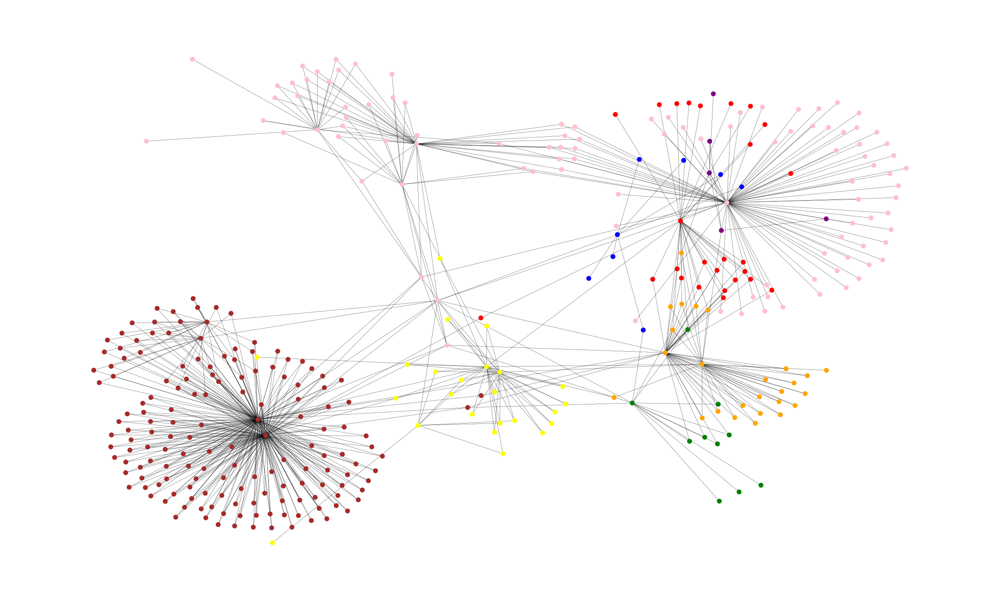

In [126]:
plt.figure(figsize=(15, 9))
plt.axis("off")
nx.draw_networkx(
    G, pos=pos, node_size=10, with_labels=False, width=0.15, node_color=node_colors
)

### Asynchronous Fluid Communities

In [127]:
# Detect communities using asynchronous fluid communities
k = 3  # Number of communities
communities = list(nx.algorithms.community.asyn_fluidc(G, k, seed=42))

# Assign a unique color to each community
colors = itertools.cycle(['red', 'blue', 'green', 'yellow', 'orange', 'purple', 'pink', 'brown'])
community_colors = {}

for color, community in zip(colors, communities):
    for node in community:
        community_colors[node] = color

node_colors = [community_colors[node] for node in G.nodes]

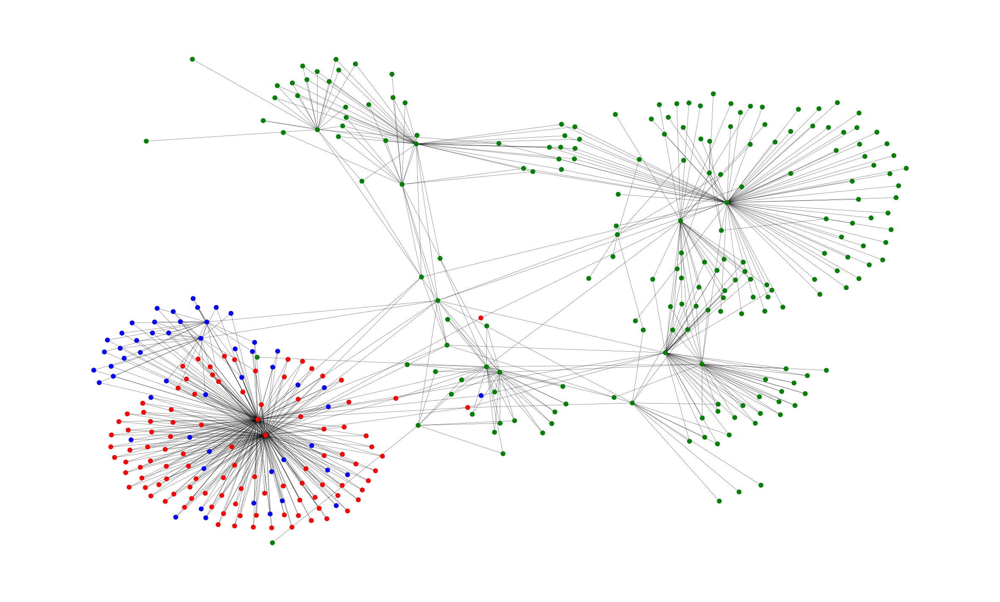

In [128]:
plt.figure(figsize=(15, 9))
plt.axis("off")
nx.draw_networkx(
    G, pos=pos, node_size=10, with_labels=False, width=0.15, node_color=node_colors
)